<a href="https://colab.research.google.com/github/SandroBiten/PUC_BIGDATA/blob/main/Machine_Learning_Preparo_de_Dados_Pos_BIGDATA_20220530_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Importar as libraries necessárias**

In [ ]:
pip install --upgrade scikit-learn==0.20.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import glob

np.set_printoptions(formatter = {'float': lambda x: "{0:0.2f}".format(x)})

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import accuracy_score # para medir a acurácia do modelo preditivo
#from sklearn.model_selection import train_test_split
#from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix # para plotar a confusion matrix

from sklearn.model_selection import GridSearchCV # para otimizar os parâmetros dos modelos preditivos
from sklearn.model_selection import cross_val_score
from time import time
from operator import itemgetter
from scipy.stats import randint

from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

# Importar o classificador (modelo, algoritmo, ...)
from sklearn.tree import DecisionTreeClassifier # Este é o nosso classificador

np.set_printoptions(suppress=True)

In [ ]:
#!pip install graphviz
#!pip install pydotplus

# **Montar Driver**#

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Dados**#

In [ ]:
folder_path = '/content/drive/MyDrive/Pos/'
FUSÃO_COVID_TSE_IBGE_SUS_10 = pd.read_excel (io = folder_path + 'FUSÃO_COVID_TSE_IBGE_SUS_10.xlsx', sheet_name='FUSÃO_COVID_TSE_IBGE_SUS_10')

FUSÃO_COVID_TSE_IBGE_SUS_10.head()

,regiao,SG_UF,NM_MUNICIPIO,populacaoTCU2019,Tamnho_Mun,NR_PARTIDO_2020,SG_PARTIDO_2020,PLB_2013_2020,ESPECTRO_2020,ESPECTRO_2020_DIREITA_CONSERVADORA,ESPECTRO_2020_DIREITA_PROGRESSISTA,ESPECTRO_2020_ESQUERDA_CONSERVADORA,ESPECTRO_2020_ESQUERDA_PROGRESSISTA,codRegiaoSaude,nomeRegiaoSaude,Pobreza_%_2003,Gini_2003,PIB_per_capita_2019,Rendimento_mensal_per_capita_Até_meio_SM_%_2010,Saneamento_Esgotamento_adequado_%_2010,Urbanização_%_vias_públicas_2010,Mortalidade_infantil_PER_MIL_2012_2014,Educacao_Anos_finais_Fundamental_2015,Educacao_Anos_iniciais_Fundamental_2015,Rendimento_médio_mensal_SM_2015,Internações_Diarreia_PER_MIL_2016,População_ocupada_%_2019,Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010,Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010,Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010,Educação_10_anos_ou_mais_Superior_%_completo_2010,Educação_10_anos_ou_mais_Ocupada_%_2010,Educação_10_anos_ou_mais_Não_ocupada_%_2010,IDH_2010,Indice_Educacao_Médio_Pública_2019,Indice_Educacao_Fundamental_Anos_finais_Pública_2019,Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019,Cor_Amarela_%_2010,Cor_Branca_%_2010,Cor_Indígena_%_2010,Cor_Parda_%_2010,Cor_Preta_%_2010,Sem_Declaração_de_Cor_%_2010,Saneamento_Adequado_%_2010,Saneamento_Inadequado_%_2010,Saneamento_Semi-adequado_%_2010,Taxa_analfabetismo_população_15_anos_ou_mais_%_2010,Saneamento_Edificios_Abastecidos_Agua_PER_2017,Saneamento_Edificios_Esgotados_PER_2017,Despesas_orçamentárias_empenhadas_PER_2017,Notificações_Dengue_PER_MIL_2012,Idade_0_a_4_%_2010,Idade_5_a_9_%_2010,Idade_10_a_14_%_2010,Idade_15_a_19_%_2010,Idade_20_a_24_%_2010,Idade_25_a_29_%_2010,Idade_30_a_39_%_2010,Idade_40_a_49_%_2010,Idade_50_a_59_%_2010,Idade_60_a_69_%_2010,Idade_70_a_mais_%_2010,obitos_Acum_PER_Aumento_2020,populacaoTCU2019_REGIAO,QT_CONTR_SUS_PER*10000,QT_EXIST_SUS_PER*10000,QT_SUS_PER*10000,QT_CONTR_REGIAO_SUS_PER*10000,QT_EXIST_REGIAO_SUS_PER*10000,QT_SUS_REGIAO_PER*10000
0,Centro-Oeste,MS,AGUA CLARA,15522,"(0, 25000]",55.0,PSD,6.0,DIREITA_CONSERVADORA,1,0,0,0,50004,TRES LAGOAS,33.06,0.41,72697.25,33.3,3.8,6.4,12.7,5.2,6.4,2.5,0.3,29.0,65.724472,16.221034,13.131313,4.388422,60.402343,39.606145,0.670,0.0,5.0,5.9,1.564027,40.748499,0.153610,48.931713,8.602151,0.0,3.3,25.5,71.1,9.0,31.014045,0.000000,4190.139490,0.193274,9.394065,9.886301,9.005824,9.858569,9.803106,17.103439,12.638658,7.924293,8.929562,3.494176,1.962008,418.760469,283628,0.0,13.529184,13.529184,0.0,31.308616,18.968508
1,Centro-Oeste,MS,ALCINOPOLIS,5343,"(0, 25000]",25.0,DEM,6.4,DIREITA_CONSERVADORA,1,0,0,0,50001,CAMPO GRANDE,40.28,0.40,31408.71,32.2,0.4,3.2,0.0,0.0,5.3,2.5,0.0,11.5,61.146990,16.791527,14.259881,7.698269,61.973650,38.026350,0.711,0.0,4.2,5.3,0.482774,49.155146,0.043889,44.612684,5.705508,0.0,0.4,32.3,67.3,11.0,30.694366,0.000000,5708.992452,0.374322,7.419567,8.688991,9.148610,9.301817,8.995404,16.808930,14.379514,9.170497,7.857299,5.099584,3.129788,224.592925,1520047,0.0,0.000000,0.000000,0.0,30.301695,18.361274
2,Centro-Oeste,MS,AMAMBAI,39396,"(25000, 80000]",45.0,PSDB,4.1,DIREITA_CONSERVADORA,1,0,0,0,50003,DOURADOS,35.84,0.45,24687.68,37.8,23.7,13.1,28.0,4.1,5.7,2.0,6.3,13.9,60.371617,15.802664,17.120149,6.412001,53.891594,46.108406,0.673,4.1,5.2,6.0,0.377863,50.735380,20.930706,25.752819,2.203232,0.0,22.5,16.1,61.4,11.1,22.908417,7.683521,2984.604987,0.177683,9.473078,10.204434,9.945292,8.496977,8.462424,14.799885,11.004895,7.834725,10.100777,5.240426,4.437086,213.219616,840545,0.0,25.637121,16.499137,0.0,26.244877,17.381580
3,Centro-Oeste,MS,ANASTACIO,25135,"(25000, 80000]",45.0,PSDB,4.1,DIREITA_CONSERVADORA,1,0,0,0,50001,CAMPO GRANDE,41.22,0.44,19920.79,37.6,45.3,7.8,13.2,3.8,4.6,1.8,0.2,11.4,62.281098,16.092127,15.911486,5.554719,54.282704,45.717296,0.663,3.4,4.3,4.7,1.098300,41.323010,6.097458,47.517253,3.963979,0.0,39.9,12.3,47.8,11.5,29.166501,4.630993,1779.895223,1.790332,7.644221,9.326621,9.385358,7.984057,8.135095,14.684288,12.7417

In [ ]:
indexNames = FUSÃO_COVID_TSE_IBGE_SUS_10 [FUSÃO_COVID_TSE_IBGE_SUS_10 ['obitos_Acum_PER_Aumento_2020'] < 0].index
# Delete valores negativos

FUSÃO_COVID_TSE_IBGE_SUS_10.drop(indexNames , inplace=True)

FUSÃO_COVID_TSE_IBGE_SUS_10 [FUSÃO_COVID_TSE_IBGE_SUS_10 ['obitos_Acum_PER_Aumento_2020'] < 0]


,regiao,SG_UF,NM_MUNICIPIO,populacaoTCU2019,Tamnho_Mun,NR_PARTIDO_2020,SG_PARTIDO_2020,PLB_2013_2020,ESPECTRO_2020,ESPECTRO_2020_DIREITA_CONSERVADORA,ESPECTRO_2020_DIREITA_PROGRESSISTA,ESPECTRO_2020_ESQUERDA_CONSERVADORA,ESPECTRO_2020_ESQUERDA_PROGRESSISTA,codRegiaoSaude,nomeRegiaoSaude,Pobreza_%_2003,Gini_2003,PIB_per_capita_2019,Rendimento_mensal_per_capita_Até_meio_SM_%_2010,Saneamento_Esgotamento_adequado_%_2010,Urbanização_%_vias_públicas_2010,Mortalidade_infantil_PER_MIL_2012_2014,Educacao_Anos_finais_Fundamental_2015,Educacao_Anos_iniciais_Fundamental_2015,Rendimento_médio_mensal_SM_2015,Internações_Diarreia_PER_MIL_2016,População_ocupada_%_2019,Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010,Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010,Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010,Educação_10_anos_ou_mais_Superior_%_completo_2010,Educação_10_anos_ou_mais_Ocupada_%_2010,Educação_10_anos_ou_mais_Não_ocupada_%_2010,IDH_2010,Indice_Educacao_Médio_Pública_2019,Indice_Educacao_Fundamental_Anos_finais_Pública_2019,Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019,Cor_Amarela_%_2010,Cor_Branca_%_2010,Cor_Indígena_%_2010,Cor_Parda_%_2010,Cor_Preta_%_2010,Sem_Declaração_de_Cor_%_2010,Saneamento_Adequado_%_2010,Saneamento_Inadequado_%_2010,Saneamento_Semi-adequado_%_2010,Taxa_analfabetismo_população_15_anos_ou_mais_%_2010,Saneamento_Edificios_Abastecidos_Agua_PER_2017,Saneamento_Edificios_Esgotados_PER_2017,Despesas_orçamentárias_empenhadas_PER_2017,Notificações_Dengue_PER_MIL_2012,Idade_0_a_4_%_2010,Idade_5_a_9_%_2010,Idade_10_a_14_%_2010,Idade_15_a_19_%_2010,Idade_20_a_24_%_2010,Idade_25_a_29_%_2010,Idade_30_a_39_%_2010,Idade_40_a_49_%_2010,Idade_50_a_59_%_2010,Idade_60_a_69_%_2010,Idade_70_a_mais_%_2010,obitos_Acum_PER_Aumento_2020,populacaoTCU2019_REGIAO,QT_CONTR_SUS_PER*10000,QT_EXIST_SUS_PER*10000,QT_SUS_PER*10000,QT_CONTR_REGIAO_SUS_PER*10000,QT_EXIST_REGIAO_SUS_PER*10000,QT_SUS_REGIAO_PER*10000


In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_10 ['obitos_Acum_PER_Aumento_2020'].median()

170.25140512240205

In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_20 = FUSÃO_COVID_TSE_IBGE_SUS_10.copy()

# Se obitos_Acum_PER_Aumento_2020 > 151.3431706394249 (mediana) - Classificar 1: 

FUSÃO_COVID_TSE_IBGE_SUS_20 ['obitos_Acum_PER_Aumento_Gravidade_2020'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['obitos_Acum_PER_Aumento_2020'] .apply(lambda x : 1 if x > FUSÃO_COVID_TSE_IBGE_SUS_20 ['obitos_Acum_PER_Aumento_2020'].median() else 0)

FUSÃO_COVID_TSE_IBGE_SUS_20.drop('obitos_Acum_PER_Aumento_2020', axis = 1, inplace = True)

FUSÃO_COVID_TSE_IBGE_SUS_20.head()

,regiao,SG_UF,NM_MUNICIPIO,populacaoTCU2019,Tamnho_Mun,NR_PARTIDO_2020,SG_PARTIDO_2020,PLB_2013_2020,ESPECTRO_2020,ESPECTRO_2020_DIREITA_CONSERVADORA,ESPECTRO_2020_DIREITA_PROGRESSISTA,ESPECTRO_2020_ESQUERDA_CONSERVADORA,ESPECTRO_2020_ESQUERDA_PROGRESSISTA,codRegiaoSaude,nomeRegiaoSaude,Pobreza_%_2003,Gini_2003,PIB_per_capita_2019,Rendimento_mensal_per_capita_Até_meio_SM_%_2010,Saneamento_Esgotamento_adequado_%_2010,Urbanização_%_vias_públicas_2010,Mortalidade_infantil_PER_MIL_2012_2014,Educacao_Anos_finais_Fundamental_2015,Educacao_Anos_iniciais_Fundamental_2015,Rendimento_médio_mensal_SM_2015,Internações_Diarreia_PER_MIL_2016,População_ocupada_%_2019,Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010,Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010,Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010,Educação_10_anos_ou_mais_Superior_%_completo_2010,Educação_10_anos_ou_mais_Ocupada_%_2010,Educação_10_anos_ou_mais_Não_ocupada_%_2010,IDH_2010,Indice_Educacao_Médio_Pública_2019,Indice_Educacao_Fundamental_Anos_finais_Pública_2019,Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019,Cor_Amarela_%_2010,Cor_Branca_%_2010,Cor_Indígena_%_2010,Cor_Parda_%_2010,Cor_Preta_%_2010,Sem_Declaração_de_Cor_%_2010,Saneamento_Adequado_%_2010,Saneamento_Inadequado_%_2010,Saneamento_Semi-adequado_%_2010,Taxa_analfabetismo_população_15_anos_ou_mais_%_2010,Saneamento_Edificios_Abastecidos_Agua_PER_2017,Saneamento_Edificios_Esgotados_PER_2017,Despesas_orçamentárias_empenhadas_PER_2017,Notificações_Dengue_PER_MIL_2012,Idade_0_a_4_%_2010,Idade_5_a_9_%_2010,Idade_10_a_14_%_2010,Idade_15_a_19_%_2010,Idade_20_a_24_%_2010,Idade_25_a_29_%_2010,Idade_30_a_39_%_2010,Idade_40_a_49_%_2010,Idade_50_a_59_%_2010,Idade_60_a_69_%_2010,Idade_70_a_mais_%_2010,populacaoTCU2019_REGIAO,QT_CONTR_SUS_PER*10000,QT_EXIST_SUS_PER*10000,QT_SUS_PER*10000,QT_CONTR_REGIAO_SUS_PER*10000,QT_EXIST_REGIAO_SUS_PER*10000,QT_SUS_REGIAO_PER*10000,obitos_Acum_PER_Aumento_Gravidade_2020
0,Centro-Oeste,MS,AGUA CLARA,15522,"(0, 25000]",55.0,PSD,6.0,DIREITA_CONSERVADORA,1,0,0,0,50004,TRES LAGOAS,33.06,0.41,72697.25,33.3,3.8,6.4,12.7,5.2,6.4,2.5,0.3,29.0,65.724472,16.221034,13.131313,4.388422,60.402343,39.606145,0.670,0.0,5.0,5.9,1.564027,40.748499,0.153610,48.931713,8.602151,0.0,3.3,25.5,71.1,9.0,31.014045,0.000000,4190.139490,0.193274,9.394065,9.886301,9.005824,9.858569,9.803106,17.103439,12.638658,7.924293,8.929562,3.494176,1.962008,283628,0.0,13.529184,13.529184,0.0,31.308616,18.968508,1
1,Centro-Oeste,MS,ALCINOPOLIS,5343,"(0, 25000]",25.0,DEM,6.4,DIREITA_CONSERVADORA,1,0,0,0,50001,CAMPO GRANDE,40.28,0.40,31408.71,32.2,0.4,3.2,0.0,0.0,5.3,2.5,0.0,11.5,61.146990,16.791527,14.259881,7.698269,61.973650,38.026350,0.711,0.0,4.2,5.3,0.482774,49.155146,0.043889,44.612684,5.705508,0.0,0.4,32.3,67.3,11.0,30.694366,0.000000,5708.992452,0.374322,7.419567,8.688991,9.148610,9.301817,8.995404,16.808930,14.379514,9.170497,7.857299,5.099584,3.129788,1520047,0.0,0.000000,0.000000,0.0,30.301695,18.361274,1
2,Centro-Oeste,MS,AMAMBAI,39396,"(25000, 80000]",45.0,PSDB,4.1,DIREITA_CONSERVADORA,1,0,0,0,50003,DOURADOS,35.84,0.45,24687.68,37.8,23.7,13.1,28.0,4.1,5.7,2.0,6.3,13.9,60.371617,15.802664,17.120149,6.412001,53.891594,46.108406,0.673,4.1,5.2,6.0,0.377863,50.735380,20.930706,25.752819,2.203232,0.0,22.5,16.1,61.4,11.1,22.908417,7.683521,2984.604987,0.177683,9.473078,10.204434,9.945292,8.496977,8.462424,14.799885,11.004895,7.834725,10.100777,5.240426,4.437086,840545,0.0,25.637121,16.499137,0.0,26.244877,17.381580,1
3,Centro-Oeste,MS,ANASTACIO,25135,"(25000, 80000]",45.0,PSDB,4.1,DIREITA_CONSERVADORA,1,0,0,0,50001,CAMPO GRANDE,41.22,0.44,19920.79,37.6,45.3,7.8,13.2,3.8,4.6,1.8,0.2,11.4,62.281098,16.092127,15.911486,5.554719,54.282704,45.717296,0.663,3.4,4.3,4.7,1.098300,41.323010,6.097458,47.517253,3.963979,0.0,39.9,12.3,47.8,11.5,29.166501,4.630993,1779.895223,1.790332,7.644221,9.326621,9.385358,7.984057,8.135095,14.684288,12.741766,9.754563,8.743

In [ ]:
colunas = ['s_regiao', 's_SG_UF', 's_NM_MUNICIPIO', 'i_populacaoTCU2019', 's_Tamnho_Mun',
           's_NR_PARTIDO_2020', 's_SG_PARTIDO_2020', 'f_PLB_2013_2020', 's_ESPECTRO_2020',
           'b_ESPECTRO_2020_DIREITA_CONSERVADORA', 'b_ESPECTRO_2020_DIREITA_PROGRESSISTA',
           'b_ESPECTRO_2020_ESQUERDA_CONSERVADORA', 'b_ESPECTRO_2020_ESQUERDA_PROGRESSISTA', 's_codRegiaoSaude',
           's_nomeRegiaoSaude', 'f_Pobreza_%_2003', 'f_Gini_2003', 'f_PIB_per_capita_2019',
           'f_Rendimento_mensal_per_capita_Até_meio_SM_%_2010', 'f_Saneamento_Esgotamento_adequado_%_2010',
           'f_Urbanização_%_vias_públicas_2010', 'f_Mortalidade_infantil_PER_MIL_2012_2014',
           'f_Educacao_Anos_finais_Fundamental_2015', 'f_Educacao_Anos_iniciais_Fundamental_2015',
           'f_Rendimento_médio_mensal_SM_2015', 'f_Internações_Diarreia_PER_MIL_2016',
           'f_População_ocupada_%_2019', 'f_Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010',
           'f_Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010',
           'f_Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010',
           'f_Educação_10_anos_ou_mais_Superior_%_completo_2010', 'f_Educação_10_anos_ou_mais_Ocupada_%_2010',
           'f_Educação_10_anos_ou_mais_Não_ocupada_%_2010', 'f_IDH_2010', 'f_Indice_Educacao_Médio_Pública_2019',
           'f_Indice_Educacao_Fundamental_Anos_finais_Pública_2019', 'f_Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019',
           'f_Cor_Amarela_%_2010', 'f_Cor_Branca_%_2010', 'f_Cor_Indígena_%_2010',
           'f_Cor_Parda_%_2010', 'f_Cor_Preta_%_2010', 'f_Sem_Declaração_de_Cor_%_2010',
           'f_Saneamento_Adequado_%_2010', 'f_Saneamento_Inadequado_%_2010', 'f_Saneamento_Semi-adequado_%_2010',
           'f_Taxa_analfabetismo_população_15_anos_ou_mais_%_2010', 'f_Saneamento_Edificios_Abastecidos_Agua_PER_2017',
           'f_Saneamento_Edificios_Esgotados_PER_2017', 'f_Despesas_orçamentárias_empenhadas_PER_2017',
           'f_Notificações_Dengue_PER_MIL_2012', 'f_Idade_0_a_4_%_2010', 'f_Idade_5_a_9_%_2010', 'f_Idade_10_a_14_%_2010',
           'f_Idade_15_a_19_%_2010', 'f_Idade_20_a_24_%_2010', 'f_Idade_25_a_29_%_2010', 'f_Idade_30_a_39_%_2010',
           'f_Idade_40_a_49_%_2010', 'f_Idade_50_a_59_%_2010', 'f_Idade_60_a_69_%_2010', 'f_Idade_70_a_mais_%_2010', 
           'i_populacaoTCU2019_REGIAO', 'f_QT_CONTR_SUS_PER*10000', 'f_QT_EXIST_SUS_PER*10000', 'f_QT_SUS_PER*10000',
           'f_QT_CONTR_REGIAO_SUS_PER*10000', 'f_QT_EXIST_REGIAO_SUS_PER*10000', 'f_QT_SUS_REGIAO_PER*10000', 
           'b_obitos_Acum_PER_Aumento_Gravidade_2020']

FUSÃO_COVID_TSE_IBGE_SUS_20.columns = colunas

In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_regiao'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_regiao'].astype("string")
FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_SG_UF'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_SG_UF'].astype("string")
FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_NM_MUNICIPIO'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_NM_MUNICIPIO'].astype("string")
FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_Tamnho_Mun'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_Tamnho_Mun'].astype("string")
FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_NR_PARTIDO_2020'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_NR_PARTIDO_2020'].astype("string")
FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_SG_PARTIDO_2020'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_SG_PARTIDO_2020'].astype("string")
FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_ESPECTRO_2020'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_ESPECTRO_2020'].astype("string")
FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_codRegiaoSaude'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_codRegiaoSaude'].astype("string")
FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_nomeRegiaoSaude'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['s_nomeRegiaoSaude'].astype("string")
 
FUSÃO_COVID_TSE_IBGE_SUS_20 ['t_ESPECTRO_2020_DIREITA_CONSERVADORA'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['b_ESPECTRO_2020_DIREITA_CONSERVADORA'].astype('float')
FUSÃO_COVID_TSE_IBGE_SUS_20 ['t_ESPECTRO_2020_DIREITA_PROGRESSISTA'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['b_ESPECTRO_2020_DIREITA_PROGRESSISTA'].astype('float')
FUSÃO_COVID_TSE_IBGE_SUS_20 ['t_ESPECTRO_2020_ESQUERDA_CONSERVADORA'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['b_ESPECTRO_2020_ESQUERDA_CONSERVADORA'].astype('float')
FUSÃO_COVID_TSE_IBGE_SUS_20 ['t_ESPECTRO_2020_ESQUERDA_PROGRESSISTA'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['b_ESPECTRO_2020_ESQUERDA_PROGRESSISTA'].astype('float')
FUSÃO_COVID_TSE_IBGE_SUS_20 ['t_obitos_Acum_PER_Aumento_Gravidade_2020'] = FUSÃO_COVID_TSE_IBGE_SUS_20 ['b_obitos_Acum_PER_Aumento_Gravidade_2020'].astype('float')

eliminando = ['b_ESPECTRO_2020_DIREITA_CONSERVADORA', 'b_ESPECTRO_2020_DIREITA_PROGRESSISTA',
              'b_ESPECTRO_2020_ESQUERDA_CONSERVADORA', 'b_ESPECTRO_2020_ESQUERDA_PROGRESSISTA', 
              'b_obitos_Acum_PER_Aumento_Gravidade_2020']

FUSÃO_COVID_TSE_IBGE_SUS_20.drop(eliminando, axis = 1, inplace = True)


In [ ]:
eliminar = ['s_NR_PARTIDO_2020', 's_SG_PARTIDO_2020', 's_ESPECTRO_2020']

FUSÃO_COVID_TSE_IBGE_SUS_20.drop(eliminar, axis = 1, inplace = True)


# **Missing Values**#

In [ ]:
for colunas in FUSÃO_COVID_TSE_IBGE_SUS_20:
  print ('\n coluna: ', colunas, ' ', FUSÃO_COVID_TSE_IBGE_SUS_20[colunas].dtypes, ' ', set(FUSÃO_COVID_TSE_IBGE_SUS_20[colunas]))


 coluna:  s_regiao   string   {'Centro-Oeste', 'Sudeste', 'Sul', 'Nordeste', 'Norte'}

 coluna:  s_SG_UF   string   {'AL', 'PE', 'SP', 'MS', 'TO', 'AM', 'AC', 'RJ', 'DF', 'AP', 'PI', 'RR', 'ES', 'PB', 'MG', 'BA', 'PA', 'RN', 'RS', 'RO', 'CE', 'GO', 'PR', 'SC', 'SE', 'MA', 'MT'}

 coluna:  s_NM_MUNICIPIO   string   {'TRES PASSOS', 'CAMPINA DO MONTE ALEGRE', 'ESTRELA DALVA', 'TAQUARANA', 'TIJUCAS', 'PANTANO GRANDE', 'PEDRO II', 'LIMA CAMPOS', 'PORTO ALEGRE DO NORTE', 'AMERICA DOURADA', 'RIO NOVO', 'TAPES', 'SANTA BARBARA DE GOIAS', 'SAO JOSE DA VITORIA', 'JERIQUARA', 'BOZANO', 'ITAU', 'ITURAMA', 'JORDANIA', 'BELO HORIZONTE', 'PROGRESSO', 'BRASNORTE', 'QUIXERAMOBIM', 'BREJO', 'FERRAZ DE VASCONCELOS', 'SANTA FE', 'COELHO NETO', 'SAO JOAO DA PONTA', 'QUATIPURU', 'FLORIANOPOLIS', 'SERROLANDIA', 'PANAMA', 'BOM JESUS DO ARAGUAIA', 'PILAO ARCADO', 'AMPARO', 'PRESIDENTE VARGAS', 'MARACAS', 'TRES BARRAS DO PARANA', 'IPIRANGA DO SUL', 'TAGUATINGA', 'IGARAPE GRANDE', 'SAO SEBASTIAO DO MARANHAO', '

In [ ]:
# Missing Values por linhas
df_null = FUSÃO_COVID_TSE_IBGE_SUS_20.copy()

trataveis = []

for colunas in df_null:
  if df_null[colunas].isna().any() == True:
    trataveis.append(colunas)
    print ('colunas: ', colunas, ' ', df_null[colunas].isna().any(), ' ', df_null[colunas].isna().sum())
print ('\ntotal: \n', df_null.isna().sum().sum())


colunas:  f_PLB_2013_2020   True   122
colunas:  f_Pobreza_%_2003   True   63
colunas:  f_Gini_2003   True   63
colunas:  f_Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010   True   5
colunas:  f_Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010   True   5
colunas:  f_Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010   True   5
colunas:  f_Educação_10_anos_ou_mais_Superior_%_completo_2010   True   5
colunas:  f_Educação_10_anos_ou_mais_Ocupada_%_2010   True   5
colunas:  f_Educação_10_anos_ou_mais_Não_ocupada_%_2010   True   5
colunas:  f_Indice_Educacao_Médio_Pública_2019   True   1
colunas:  f_Indice_Educacao_Fundamental_Anos_finais_Pública_2019   True   1
colunas:  f_Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019   True   1
colunas:  f_Cor_Amarela_%_2010   True   5
colunas:  f_Cor_Branca_%_2010   True   5
colunas:  f_Cor_Indígena_%_2010   True   5
colunas:  f_Cor_Parda_%_2010   True   5
colunas:  f_Cor_Preta_%_20

In [ ]:
for itens in trataveis:
  print ('colunas: ', itens, ' ', df_null[itens].median())


colunas:  f_PLB_2013_2020   4.58
colunas:  f_Pobreza_%_2003   40.29
colunas:  f_Gini_2003   0.39
colunas:  f_Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010   64.11796411796412
colunas:  f_Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010   15.70788839131932
colunas:  f_Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010   15.78755911240451
colunas:  f_Educação_10_anos_ou_mais_Superior_%_completo_2010   3.609721229449607
colunas:  f_Educação_10_anos_ou_mais_Ocupada_%_2010   51.72425888964112
colunas:  f_Educação_10_anos_ou_mais_Não_ocupada_%_2010   48.27389479295066
colunas:  f_Indice_Educacao_Médio_Pública_2019   3.9
colunas:  f_Indice_Educacao_Fundamental_Anos_finais_Pública_2019   4.6
colunas:  f_Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019   5.8
colunas:  f_Cor_Amarela_%_2010   0.7303534910896874
colunas:  f_Cor_Branca_%_2010   42.1308928447203
colunas:  f_Cor_Indígena_%_2010   0.04115414513695185
colunas:  f_C

In [ ]:
trataveis_2 = trataveis.copy()
trataveis_2.append('s_Tamnho_Mun')

In [ ]:
df_null_2 = df_null[trataveis_2].copy()
df_null_2

df_null_3 = df_null_2.groupby(['s_Tamnho_Mun']).median()

df_null_3

,f_PLB_2013_2020,f_Pobreza_%_2003,f_Gini_2003,f_Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010,f_Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010,f_Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010,f_Educação_10_anos_ou_mais_Superior_%_completo_2010,f_Educação_10_anos_ou_mais_Ocupada_%_2010,f_Educação_10_anos_ou_mais_Não_ocupada_%_2010,f_Indice_Educacao_Médio_Pública_2019,f_Indice_Educacao_Fundamental_Anos_finais_Pública_2019,f_Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019,f_Cor_Amarela_%_2010,f_Cor_Branca_%_2010,f_Cor_Indígena_%_2010,f_Cor_Parda_%_2010,f_Cor_Preta_%_2010,f_Sem_Declaração_de_Cor_%_2010,f_Saneamento_Adequado_%_2010,f_Saneamento_Inadequado_%_2010,f_Saneamento_Semi-adequado_%_2010,f_Taxa_analfabetismo_população_15_anos_ou_mais_%_2010,f_Notificações_Dengue_PER_MIL_2012,f_Idade_0_a_4_%_2010,f_Idade_5_a_9_%_2010,f_Idade_10_a_14_%_2010,f_Idade_15_a_19_%_2010,f_Idade_20_a_24_%_2010,f_Idade_25_a_29_%_2010,f_Idade_30_a_39_%_2010,f_Idade_40_a_49_%_2010,f_Idade_50_a_59_%_2010,f_Idade_60_a_69_%_2010,f_Idade_70_a_mais_%_2010
s_Tamnho_Mun,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
"(0, 25000]",4.58,40.340,0.39,65.536848,15.197585,14.888113,3.446426,51.614550,48.387321,3.9,4.6,5.80,0.683704,43.043958,0.000000,48.986507,4.807725,0.000000,23.45,18.60,48.20,14.05,0.171807,7.090406,9.426987,9.264766,8.326561,7.858091,14.033202,12.943752,9.715412,8.098992,6.754896,5.863314
"(1000000, 20000000]",4.58,37.710,0.45,37.319512,17.702590,30.180282,14.362467,53.750436,46.249564,4.0,4.8,6.00,1.177219,43.490456,0.164225,44.747625,7.481851,0.007802,86.40,0.20,12.60,3.50,1.266794,6.322787,7.810281,8.166331,9.211120,9.634270,16.732694,13.808011,9.911252,6.736569,5.536022,4.356808
"(25000, 80000]",4.58,42.710,0.41,61.095283,16.596256,17.455869,3.689477,50.745394,49.254606,4.0,4.6,5.70,0.819996,35.684104,0.082175,55.077854,5.609058,0.000000,37.95,12.35,40.20,13.20,0.355344,7.623171,9.732909,9.553792,9.025671,8.535222,14.723527,12.223640,8.575031,8.455029,5.771099,4.822337
"(300000, 1000000]",4.58,30.985,0.42,41.651526,18.915626,28.176119,9.298325,54.644608,45.355392,4.2,4.8,5.85,0.948105,49.342011,0.145548,41.924689,6.471643,0.000000,82.50,0.50,16.60,4.20,0.725444,6.922249,8.406258,8.537771,9.252505,9.338613,16.226043,13.866536,10.291502,7.330809,5.725033,4.315948
"(80000, 300000]",4.58,34.350,0.41,48.548644,18.678032,24.799281,6.832730,54.276367,45.723633,4.2,4.8,6.00,0.888825,47.908107,0.112118,42.340962,6.469842,0.000000,69.40,2.25,26.05,5.80,0.520589,7.254433,8.956762,8.865417,9.188754,9.064634,15.888006,13.483124,9.674704,7.761360,5.569434,4.262859


In [ ]:
# substituir NAN por mediana

FUSÃO_COVID_TSE_IBGE_SUS_30 = FUSÃO_COVID_TSE_IBGE_SUS_20.copy()

for i in trataveis:
  for index, row in FUSÃO_COVID_TSE_IBGE_SUS_30.iterrows():
    if pd.isna(row[i]):
      FUSÃO_COVID_TSE_IBGE_SUS_30.loc[index, i] = df_null_3.loc[str(row['s_Tamnho_Mun'])][i]


In [ ]:
trataveis_3 = []

for colunas in FUSÃO_COVID_TSE_IBGE_SUS_30:
  if FUSÃO_COVID_TSE_IBGE_SUS_30[colunas].isna().any() == True:
    trataveis_3.append(colunas)
    print ('colunas: ', colunas, ' ', FUSÃO_COVID_TSE_IBGE_SUS_30[colunas].isna().any(), ' ', FUSÃO_COVID_TSE_IBGE_SUS_30[colunas].isna().sum())
print ('\ntotal: \n', FUSÃO_COVID_TSE_IBGE_SUS_30.isna().sum().sum())


total: 
 0


In [ ]:
for colunas in FUSÃO_COVID_TSE_IBGE_SUS_30:
  print ('\n coluna: ', colunas, ' ', set(FUSÃO_COVID_TSE_IBGE_SUS_30[colunas])), ' ',


 coluna:  s_regiao   {'Centro-Oeste', 'Sudeste', 'Sul', 'Nordeste', 'Norte'}

 coluna:  s_SG_UF   {'AL', 'PE', 'SP', 'MS', 'TO', 'AM', 'AC', 'RJ', 'DF', 'AP', 'PI', 'RR', 'ES', 'PB', 'MG', 'BA', 'PA', 'RN', 'RS', 'RO', 'CE', 'GO', 'PR', 'SC', 'SE', 'MA', 'MT'}

 coluna:  s_NM_MUNICIPIO   {'TRES PASSOS', 'CAMPINA DO MONTE ALEGRE', 'ESTRELA DALVA', 'TAQUARANA', 'TIJUCAS', 'PANTANO GRANDE', 'PEDRO II', 'LIMA CAMPOS', 'PORTO ALEGRE DO NORTE', 'AMERICA DOURADA', 'RIO NOVO', 'TAPES', 'SANTA BARBARA DE GOIAS', 'SAO JOSE DA VITORIA', 'JERIQUARA', 'BOZANO', 'ITAU', 'ITURAMA', 'JORDANIA', 'BELO HORIZONTE', 'PROGRESSO', 'BRASNORTE', 'QUIXERAMOBIM', 'BREJO', 'FERRAZ DE VASCONCELOS', 'SANTA FE', 'COELHO NETO', 'SAO JOAO DA PONTA', 'QUATIPURU', 'FLORIANOPOLIS', 'SERROLANDIA', 'PANAMA', 'BOM JESUS DO ARAGUAIA', 'PILAO ARCADO', 'AMPARO', 'PRESIDENTE VARGAS', 'MARACAS', 'TRES BARRAS DO PARANA', 'IPIRANGA DO SUL', 'TAGUATINGA', 'IGARAPE GRANDE', 'SAO SEBASTIAO DO MARANHAO', 'AUGUSTINOPOLIS', 'SAO DOMIN

# **Dummies**#

In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_30.dtypes [(FUSÃO_COVID_TSE_IBGE_SUS_30.dtypes != 'int64') & (FUSÃO_COVID_TSE_IBGE_SUS_30.dtypes != 'float64')]

s_regiao             string
s_SG_UF              string
s_NM_MUNICIPIO       string
s_Tamnho_Mun         string
s_codRegiaoSaude     string
s_nomeRegiaoSaude    string
dtype: object

In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_30.columns

Index(['s_regiao', 's_SG_UF', 's_NM_MUNICIPIO', 'i_populacaoTCU2019',
       's_Tamnho_Mun', 'f_PLB_2013_2020', 's_codRegiaoSaude',
       's_nomeRegiaoSaude', 'f_Pobreza_%_2003', 'f_Gini_2003',
       'f_PIB_per_capita_2019',
       'f_Rendimento_mensal_per_capita_Até_meio_SM_%_2010',
       'f_Saneamento_Esgotamento_adequado_%_2010',
       'f_Urbanização_%_vias_públicas_2010',
       'f_Mortalidade_infantil_PER_MIL_2012_2014',
       'f_Educacao_Anos_finais_Fundamental_2015',
       'f_Educacao_Anos_iniciais_Fundamental_2015',
       'f_Rendimento_médio_mensal_SM_2015',
       'f_Internações_Diarreia_PER_MIL_2016', 'f_População_ocupada_%_2019',
       'f_Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010',
       'f_Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010',
       'f_Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010',
       'f_Educação_10_anos_ou_mais_Superior_%_completo_2010',
       'f_Educação_10_anos_ou_mais

In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_30_dummies = FUSÃO_COVID_TSE_IBGE_SUS_30.copy()

colunas_dummies = ['s_regiao', 's_SG_UF', 's_Tamnho_Mun']

colunas_elimina = ['s_NM_MUNICIPIO', 's_nomeRegiaoSaude', 's_codRegiaoSaude']

FUSÃO_COVID_TSE_IBGE_SUS_30_dummies = pd.get_dummies(FUSÃO_COVID_TSE_IBGE_SUS_30_dummies, columns = colunas_dummies)

FUSÃO_COVID_TSE_IBGE_SUS_30_dummies.drop(colunas_elimina, axis = 1, inplace = True)

FUSÃO_COVID_TSE_IBGE_SUS_30_dummies.head()


,i_populacaoTCU2019,f_PLB_2013_2020,f_Pobreza_%_2003,f_Gini_2003,f_PIB_per_capita_2019,f_Rendimento_mensal_per_capita_Até_meio_SM_%_2010,f_Saneamento_Esgotamento_adequado_%_2010,f_Urbanização_%_vias_públicas_2010,f_Mortalidade_infantil_PER_MIL_2012_2014,f_Educacao_Anos_finais_Fundamental_2015,f_Educacao_Anos_iniciais_Fundamental_2015,f_Rendimento_médio_mensal_SM_2015,f_Internações_Diarreia_PER_MIL_2016,f_População_ocupada_%_2019,f_Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010,f_Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010,f_Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010,f_Educação_10_anos_ou_mais_Superior_%_completo_2010,f_Educação_10_anos_ou_mais_Ocupada_%_2010,f_Educação_10_anos_ou_mais_Não_ocupada_%_2010,f_IDH_2010,f_Indice_Educacao_Médio_Pública_2019,f_Indice_Educacao_Fundamental_Anos_finais_Pública_2019,f_Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019,f_Cor_Amarela_%_2010,f_Cor_Branca_%_2010,f_Cor_Indígena_%_2010,f_Cor_Parda_%_2010,f_Cor_Preta_%_2010,f_Sem_Declaração_de_Cor_%_2010,f_Saneamento_Adequado_%_2010,f_Saneamento_Inadequado_%_2010,f_Saneamento_Semi-adequado_%_2010,f_Taxa_analfabetismo_população_15_anos_ou_mais_%_2010,f_Saneamento_Edificios_Abastecidos_Agua_PER_2017,f_Saneamento_Edificios_Esgotados_PER_2017,f_Despesas_orçamentárias_empenhadas_PER_2017,f_Notificações_Dengue_PER_MIL_2012,f_Idade_0_a_4_%_2010,f_Idade_5_a_9_%_2010,f_Idade_10_a_14_%_2010,f_Idade_15_a_19_%_2010,f_Idade_20_a_24_%_2010,f_Idade_25_a_29_%_2010,f_Idade_30_a_39_%_2010,f_Idade_40_a_49_%_2010,f_Idade_50_a_59_%_2010,f_Idade_60_a_69_%_2010,f_Idade_70_a_mais_%_2010,i_populacaoTCU2019_REGIAO,f_QT_CONTR_SUS_PER*10000,f_QT_EXIST_SUS_PER*10000,f_QT_SUS_PER*10000,f_QT_CONTR_REGIAO_SUS_PER*10000,f_QT_EXIST_REGIAO_SUS_PER*10000,f_QT_SUS_REGIAO_PER*10000,t_ESPECTRO_2020_DIREITA_CONSERVADORA,t_ESPECTRO_2020_DIREITA_PROGRESSISTA,t_ESPECTRO_2020_ESQUERDA_CONSERVADORA,t_ESPECTRO_2020_ESQUERDA_PROGRESSISTA,t_obitos_Acum_PER_Aumento_Gravidade_2020,s_regiao_Centro-Oeste,s_regiao_Nordeste,s_regiao_Norte,s_regiao_Sudeste,s_regiao_Sul,s_SG_UF_AC,s_SG_UF_AL,s_SG_UF_AM,s_SG_UF_AP,s_SG_UF_BA,s_SG_UF_CE,s_SG_UF_DF,s_SG_UF_ES,s_SG_UF_GO,s_SG_UF_MA,s_SG_UF_MG,s_SG_UF_MS,s_SG_UF_MT,s_SG_UF_PA,s_SG_UF_PB,s_SG_UF_PE,s_SG_UF_PI,s_SG_UF_PR,s_SG_UF_RJ,s_SG_UF_RN,s_SG_UF_RO,s_SG_UF_RR,s_SG_UF_RS,s_SG_UF_SC,s_SG_UF_SE,s_SG_UF_SP,s_SG_UF_TO,"s_Tamnho_Mun_(0, 25000]","s_Tamnho_Mun_(1000000, 20000000]","s_Tamnho_Mun_(25000, 80000]","s_Tamnho_Mun_(300000, 1000000]","s_Tamnho_Mun_(80000, 300000]"
0,15522,6.0,33.06,0.41,72697.25,33.3,3.8,6.4,12.7,5.2,6.4,2.5,0.3,29.0,65.724472,16.221034,13.131313,4.388422,60.402343,39.606145,0.670,0.0,5.0,5.9,1.564027,40.748499,0.153610,48.931713,8.602151,0.0,3.3,25.5,71.1,9.0,31.014045,0.000000,4190.139490,0.193274,9.394065,9.886301,9.005824,9.858569,9.803106,17.103439,12.638658,7.924293,8.929562,3.494176,1.962008,283628,0.0,13.529184,13.529184,0.0,31.308616,18.968508,1.0,0.0,0.0,0.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,5343,6.4,40.28,0.40,31408.71,32.2,0.4,3.2,0.0,0.0,5.3,2.5,0.0,11.5,61.146990,16.791527,14.259881,7.698269,61.973650,38.026350,0.711,0.0,4.2,5.3,0.482774,49.155146,0.043889,44.612684,5.705508,0.0,0.4,32.3,67.3,11.0,30.694366,0.000000,5708.992452,0.374322,7.419567,8.688991,9.148610,9.301817,8.995404,16.808930,14.379514,9.170497,7.857299,5.099584,3.129788,1520047,0.0,0.000000,0.000000,0.0,30.301695,18.361274,1.0,0.0,0.0,0.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,39396,4.1,35.84,0.45,24687.68,37.8,23.7,13.1,28.0,4.1,5.7,2.0,6.3,13.9,60.371617,15.802664,17.120149,6.412001,53.891594,46.108406,0.673,4.1,5.2,6.0,0.377863,50.735380,20.930706,25.752819,2.203232,0.0,22.5,16.1,61.4,11.1,22.908417,7.683521,2984.604987,0.177683,9.473078,10.204434,9.945292,8.496977,8.462424,14.799885,11.004895,7.834725,10.100777,5.240426,4.437086,840545,0.0,25.637121,16.499137,0.0,26.244877,17.381580,1.

In [ ]:
set(FUSÃO_COVID_TSE_IBGE_SUS_30_dummies.dtypes [(FUSÃO_COVID_TSE_IBGE_SUS_30_dummies.dtypes != 'int64') & (FUSÃO_COVID_TSE_IBGE_SUS_30_dummies.dtypes != 'float64')])

{dtype('uint8')}

# **Outliers**#

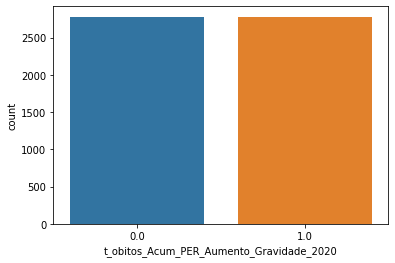

In [ ]:
sns.countplot(x = 't_obitos_Acum_PER_Aumento_Gravidade_2020', data = FUSÃO_COVID_TSE_IBGE_SUS_30_dummies)

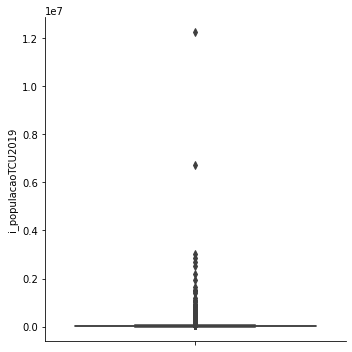

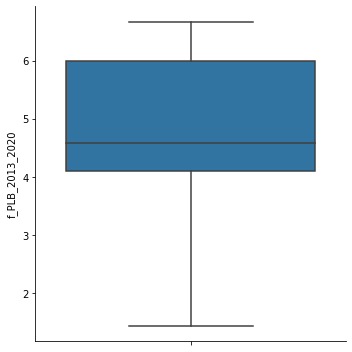

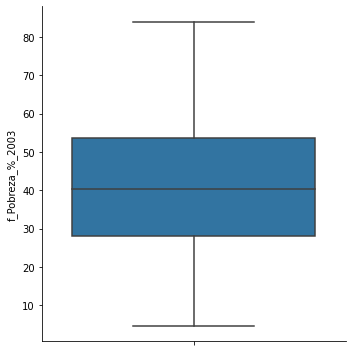

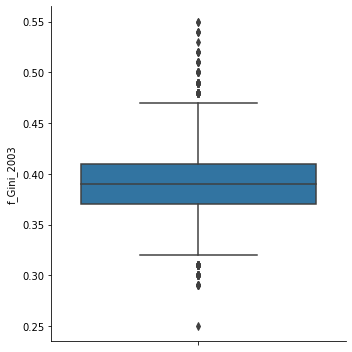

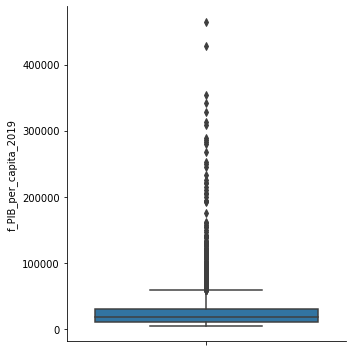

...

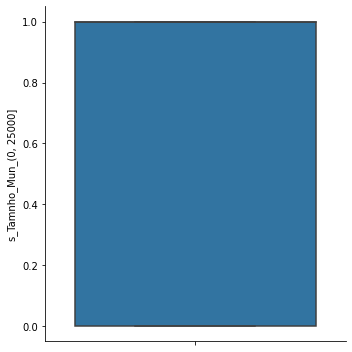

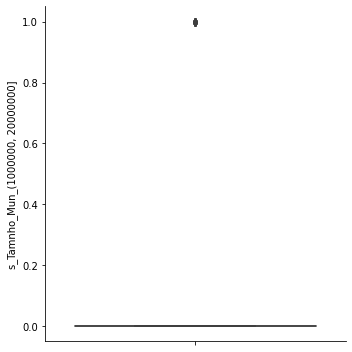

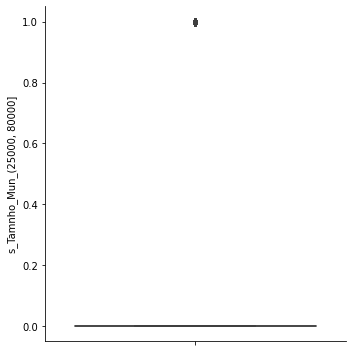

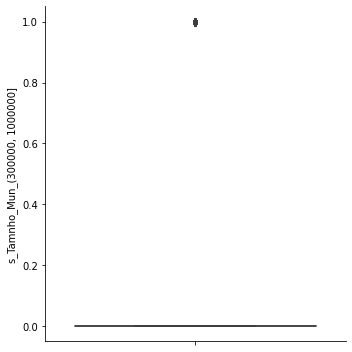

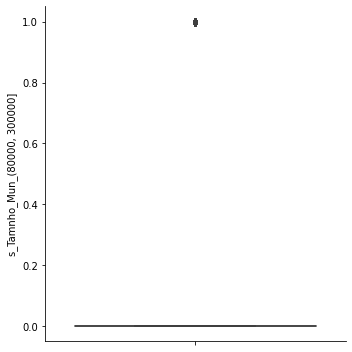

In [ ]:
for coluna in FUSÃO_COVID_TSE_IBGE_SUS_30_dummies.columns:
  sns.catplot(y = coluna, kind = 'box', data = FUSÃO_COVID_TSE_IBGE_SUS_30_dummies)

In [ ]:
colunas_rename = ['t_ESPECTRO_2020_DIREITA_CONSERVADORA', 't_ESPECTRO_2020_DIREITA_PROGRESSISTA',
                  't_ESPECTRO_2020_ESQUERDA_CONSERVADORA', 't_ESPECTRO_2020_ESQUERDA_PROGRESSISTA',
                  't_obitos_Acum_PER_Aumento_Gravidade_2020', 's_regiao_Centro-Oeste', 's_regiao_Nordeste',
                  's_regiao_Norte', 's_regiao_Sudeste', 's_regiao_Sul', 's_SG_UF_AC', 's_SG_UF_AL', 
                  's_SG_UF_AM', 's_SG_UF_AP', 's_SG_UF_BA', 's_SG_UF_CE', 's_SG_UF_DF', 's_SG_UF_ES', 
                  's_SG_UF_GO', 's_SG_UF_MA', 's_SG_UF_MG', 's_SG_UF_MS', 's_SG_UF_MT', 's_SG_UF_PA',
                  's_SG_UF_PB', 's_SG_UF_PE', 's_SG_UF_PI', 's_SG_UF_PR', 's_SG_UF_RJ', 's_SG_UF_RN',
                  's_SG_UF_RO', 's_SG_UF_RR', 's_SG_UF_RS', 's_SG_UF_SC', 's_SG_UF_SE', 's_SG_UF_SP', 
                  's_SG_UF_TO', 's_Tamnho_Mun_(0, 25000]', 's_Tamnho_Mun_(1000000, 20000000]', 
                  's_Tamnho_Mun_(25000, 80000]', 's_Tamnho_Mun_(300000, 1000000]', 
                  's_Tamnho_Mun_(80000, 300000]']

colunas_renamed = ['b_ESPECTRO_2020_DIREITA_CONSERVADORA', 'b_ESPECTRO_2020_DIREITA_PROGRESSISTA',
                  'b_ESPECTRO_2020_ESQUERDA_CONSERVADORA', 'b_ESPECTRO_2020_ESQUERDA_PROGRESSISTA',
                  'b_obitos_Acum_PER_Aumento_Gravidade_2020', 'b_regiao_Centro-Oeste', 'b_regiao_Nordeste',
                  'b_regiao_Norte', 'b_regiao_Sudeste', 'b_regiao_Sul', 'b_SG_UF_AC', 'b_SG_UF_AL', 
                  'b_SG_UF_AM', 'b_SG_UF_AP', 'b_SG_UF_BA', 'b_SG_UF_CE', 'b_SG_UF_DF', 'b_SG_UF_ES', 
                  'b_SG_UF_GO', 'b_SG_UF_MA', 'b_SG_UF_MG', 'b_SG_UF_MS', 'b_SG_UF_MT', 'b_SG_UF_PA',
                  'b_SG_UF_PB', 'b_SG_UF_PE', 'b_SG_UF_PI', 'b_SG_UF_PR', 'b_SG_UF_RJ', 'b_SG_UF_RN',
                  'b_SG_UF_RO', 'b_SG_UF_RR', 'b_SG_UF_RS', 'b_SG_UF_SC', 'b_SG_UF_SE', 'b_SG_UF_SP', 
                  'b_SG_UF_TO', 'b_Tamnho_Mun_(0, 25000]', 'b_Tamnho_Mun_(1000000, 20000000]', 
                  'b_Tamnho_Mun_(25000, 80000]', 'b_Tamnho_Mun_(300000, 1000000]', 
                  'b_Tamnho_Mun_(80000, 300000]']

FUSÃO_COVID_TSE_IBGE_SUS_30_dummies [colunas_renamed] = FUSÃO_COVID_TSE_IBGE_SUS_30_dummies [colunas_rename].copy()

FUSÃO_COVID_TSE_IBGE_SUS_30_dummies.drop(colunas_rename, axis = 1, inplace = True)

In [ ]:
for colunas in FUSÃO_COVID_TSE_IBGE_SUS_30_dummies:
  print ('\n coluna: ', colunas, ' ', set(FUSÃO_COVID_TSE_IBGE_SUS_30_dummies[colunas]))



 coluna:  i_populacaoTCU2019   {32801, 32812, 163901, 32832, 32843, 65611, 32873, 32879, 32931, 32939, 32941, 32968, 33000, 33007, 131341, 65844, 33119, 33122, 33153, 197016, 131521, 33222, 33232, 66046, 33287, 33303, 33318, 33327, 33347, 33362, 33376, 3015268, 590466, 33434, 33436, 33438, 361118, 33447, 33450, 66218, 33468, 33470, 66261, 328454, 33543, 781, 33570, 837, 33624, 33639, 132002, 935, 33705, 33718, 361400, 33742, 33760, 33782, 1034, 164880, 33808, 66580, 721944, 33817, 132123, 33822, 33835, 66612, 33850, 132157, 33870, 33877, 1112, 33900, 1149, 1154, 1164, 1165, 66712, 33951, 33959, 1246, 34028, 1260, 34031, 66801, 263410, 1267, 34095, 132400, 1331, 1333, 34103, 34109, 34116, 1351, 1360, 34132, 1377, 34146, 1381, 34152, 1388, 34170, 1406, 1427, 34213, 34221, 1453, 6718903, 1464, 1472, 230851, 1487, 1501, 1502, 1503, 1505, 1506, 34276, 1527, 1529, 34308, 34309, 1543, 1545, 1547, 99854, 34319, 1561, 1568, 1570, 1576, 34348, 1582, 1585, 1588, 34356, 34361, 1596, 1598, 34376, 

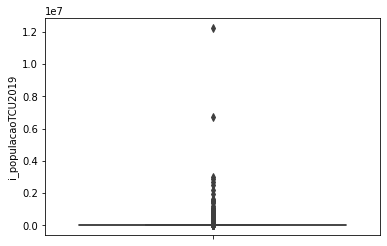

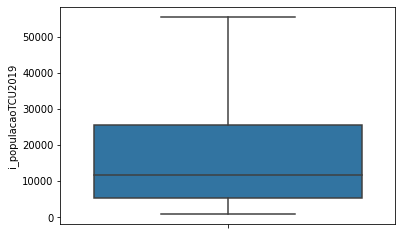

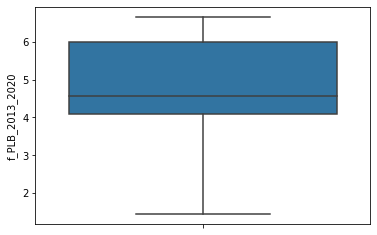

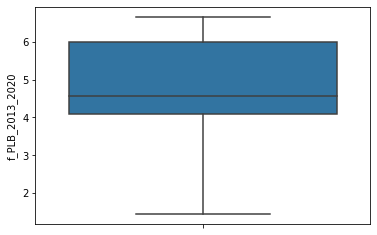

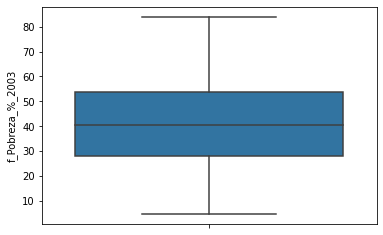

...

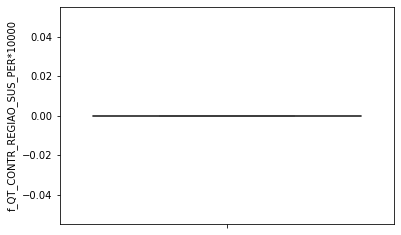

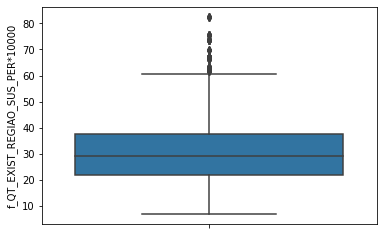

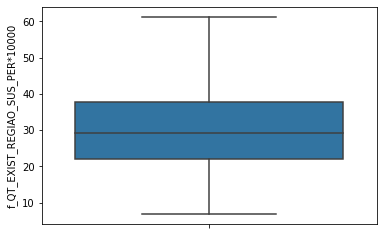

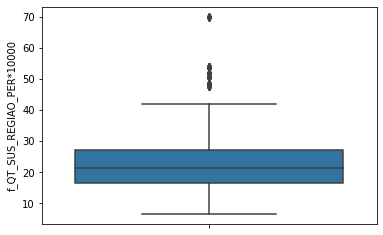

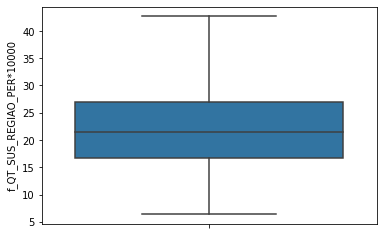

In [ ]:
# Quem são os outliers em termos de height e weight?         ###### SEM OUTLIERS

FUSÃO_COVID_TSE_IBGE_SUS_40_dummies = FUSÃO_COVID_TSE_IBGE_SUS_30_dummies.copy()

colunas = ['i_populacaoTCU2019', 'f_PLB_2013_2020', 'f_Pobreza_%_2003', 'f_Gini_2003', 'f_PIB_per_capita_2019', 'f_Rendimento_mensal_per_capita_Até_meio_SM_%_2010',
           'f_Saneamento_Esgotamento_adequado_%_2010', 'f_Urbanização_%_vias_públicas_2010', 'f_Mortalidade_infantil_PER_MIL_2012_2014',
           'f_Educacao_Anos_finais_Fundamental_2015', 'f_Educacao_Anos_iniciais_Fundamental_2015', 'f_Rendimento_médio_mensal_SM_2015',
           'f_Internações_Diarreia_PER_MIL_2016', 'f_População_ocupada_%_2019', 'f_Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010',
           'f_Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010', 'f_Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010',
           'f_Educação_10_anos_ou_mais_Superior_%_completo_2010', 'f_Educação_10_anos_ou_mais_Ocupada_%_2010', 'f_Educação_10_anos_ou_mais_Não_ocupada_%_2010', 'f_IDH_2010',
           'f_Indice_Educacao_Médio_Pública_2019','f_Indice_Educacao_Fundamental_Anos_finais_Pública_2019','f_Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019',
           'f_Cor_Amarela_%_2010', 'f_Cor_Branca_%_2010', 'f_Cor_Indígena_%_2010', 'f_Cor_Parda_%_2010', 'f_Cor_Preta_%_2010',
           'f_Sem_Declaração_de_Cor_%_2010', 'f_Saneamento_Adequado_%_2010', 'f_Saneamento_Inadequado_%_2010', 'f_Saneamento_Semi-adequado_%_2010',
           'f_Taxa_analfabetismo_população_15_anos_ou_mais_%_2010', 'f_Saneamento_Edificios_Abastecidos_Agua_PER_2017', 'f_Saneamento_Edificios_Esgotados_PER_2017',
           'f_Despesas_orçamentárias_empenhadas_PER_2017', 'f_Notificações_Dengue_PER_MIL_2012', 'f_Idade_0_a_4_%_2010', 'f_Idade_5_a_9_%_2010', 'f_Idade_10_a_14_%_2010',
           'f_Idade_15_a_19_%_2010', 'f_Idade_20_a_24_%_2010', 'f_Idade_25_a_29_%_2010', 'f_Idade_30_a_39_%_2010', 'f_Idade_40_a_49_%_2010', 'f_Idade_50_a_59_%_2010',
           'f_Idade_60_a_69_%_2010', 'f_Idade_70_a_mais_%_2010', 'i_populacaoTCU2019_REGIAO', 'f_QT_CONTR_SUS_PER*10000', 'f_QT_EXIST_SUS_PER*10000', 'f_QT_SUS_PER*10000',
           'f_QT_CONTR_REGIAO_SUS_PER*10000', 'f_QT_EXIST_REGIAO_SUS_PER*10000', 'f_QT_SUS_REGIAO_PER*10000']

for columns in colunas:

  # Vamos usar o método np.percentile(array, q = [p1, p2, p3, ..., p99])
  percentis = np.percentile(FUSÃO_COVID_TSE_IBGE_SUS_40_dummies[columns], q = [1, 5,25, 50, 55, 75, 99])

  # Primeiro Quartil
  q1 = percentis[2]  
  q3 = percentis[5]

  # lim_inferior_outlier e lim_superior_outlier para detecção de outliers
  lim_inferior_outlier = q1 - 1.5 * (q3 - q1)

#  if lim_inferior_outlier < 0:
#    lim_inferior_outlier = 0

  lim_superior_outlier = q3 + 1.5 * (q3 - q1)
  
  pre = FUSÃO_COVID_TSE_IBGE_SUS_40_dummies [columns]

  sns.boxplot(y = pre)
  plt.show()

  FUSÃO_COVID_TSE_IBGE_SUS_40_dummies[columns] = FUSÃO_COVID_TSE_IBGE_SUS_40_dummies[columns] .apply(lambda x : lim_inferior_outlier if (x < lim_inferior_outlier) else (lim_superior_outlier if (x > lim_superior_outlier) else x))

  pos = FUSÃO_COVID_TSE_IBGE_SUS_40_dummies [columns]

  sns.boxplot(y = pos)
  plt.show()

In [ ]:
# Quem são os outliers em termos de height e weight?         ###### SEM OUTLIERS

FUSÃO_COVID_TSE_IBGE_SUS_15 = FUSÃO_COVID_TSE_IBGE_SUS_10.copy()

colunas = ['obitos_Acum_PER_Aumento_2020']

for columns in colunas:

  # Vamos usar o método np.percentile(array, q = [p1, p2, p3, ..., p99])
  percentis = np.percentile(FUSÃO_COVID_TSE_IBGE_SUS_15[columns], q = [1, 5, 25, 50, 55, 75, 99])

  # Primeiro Quartil
  q1 = percentis[2]  
  q3 = percentis[5]

  # lim_inferior_outlier e lim_superior_outlier para detecção de outliers
  lim_inferior_outlier = q1 - 1.5 * (q3 - q1)
  
#  if lim_inferior_outlier < 0:
#    lim_inferior_outlier = 0

  lim_superior_outlier = q3 + 1.5 * (q3 - q1)
  
print (lim_inferior_outlier, ' ', lim_superior_outlier)

-127.88120919355484   487.7513652581034


In [ ]:
for colunas in FUSÃO_COVID_TSE_IBGE_SUS_40_dummies.columns:
  print ('\n coluna: ', colunas, ' ', set(FUSÃO_COVID_TSE_IBGE_SUS_40_dummies[colunas]))



 coluna:  i_populacaoTCU2019   {16388.0, 16389.0, 8201.0, 8202.0, 16394.0, 8205.0, 16406.0, 16408.0, 16409.0, 8219.0, 32801.0, 8226.0, 40997.0, 24615.0, 32812.0, 41005.0, 8239.0, 41008.0, 8243.0, 8244.0, 24629.0, 8245.0, 8249.0, 8250.0, 16444.0, 32832.0, 24642.0, 8258.0, 24643.0, 32843.0, 16461.0, 24654.0, 16462.0, 8270.0, 8275.0, 8283.0, 41052.0, 24670.0, 8286.0, 16480.0, 24674.0, 8294.0, 8295.0, 8297.0, 32873.0, 32879.0, 16496.0, 8307.0, 24692.0, 8309.0, 8310.0, 16502.0, 41077.0, 8316.0, 8317.0, 24700.0, 8319.0, 8322.0, 16515.0, 8323.0, 8329.0, 24727.0, 16538.0, 8347.0, 32931.0, 8358.0, 8359.0, 8361.0, 16554.0, 16555.0, 32939.0, 16557.0, 32941.0, 41135.0, 16559.0, 8371.0, 24755.0, 16566.0, 8385.0, 8389.0, 8392.0, 8393.0, 41161.0, 8395.0, 32968.0, 8409.0, 41178.0, 8412.0, 8185.0, 8417.0, 8419.0, 24804.0, 8420.0, 33000.0, 33007.0, 8432.0, 8434.0, 16628.0, 8439.0, 16634.0, 24827.0, 24833.0, 8450.0, 16643.0, 24839.0, 24841.0, 49418.0, 24847.0, 49425.0, 16658.0, 16659.0, 16665.0, 49435.0

In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_15_outlier = FUSÃO_COVID_TSE_IBGE_SUS_10 [FUSÃO_COVID_TSE_IBGE_SUS_10['obitos_Acum_PER_Aumento_2020'] > 487.7513652581034].copy()

FUSÃO_COVID_TSE_IBGE_SUS_15_outlier.head()


,regiao,SG_UF,NM_MUNICIPIO,populacaoTCU2019,Tamnho_Mun,NR_PARTIDO_2020,SG_PARTIDO_2020,PLB_2013_2020,ESPECTRO_2020,ESPECTRO_2020_DIREITA_CONSERVADORA,ESPECTRO_2020_DIREITA_PROGRESSISTA,ESPECTRO_2020_ESQUERDA_CONSERVADORA,ESPECTRO_2020_ESQUERDA_PROGRESSISTA,codRegiaoSaude,nomeRegiaoSaude,Pobreza_%_2003,Gini_2003,PIB_per_capita_2019,Rendimento_mensal_per_capita_Até_meio_SM_%_2010,Saneamento_Esgotamento_adequado_%_2010,Urbanização_%_vias_públicas_2010,Mortalidade_infantil_PER_MIL_2012_2014,Educacao_Anos_finais_Fundamental_2015,Educacao_Anos_iniciais_Fundamental_2015,Rendimento_médio_mensal_SM_2015,Internações_Diarreia_PER_MIL_2016,População_ocupada_%_2019,Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010,Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010,Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010,Educação_10_anos_ou_mais_Superior_%_completo_2010,Educação_10_anos_ou_mais_Ocupada_%_2010,Educação_10_anos_ou_mais_Não_ocupada_%_2010,IDH_2010,Indice_Educacao_Médio_Pública_2019,Indice_Educacao_Fundamental_Anos_finais_Pública_2019,Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019,Cor_Amarela_%_2010,Cor_Branca_%_2010,Cor_Indígena_%_2010,Cor_Parda_%_2010,Cor_Preta_%_2010,Sem_Declaração_de_Cor_%_2010,Saneamento_Adequado_%_2010,Saneamento_Inadequado_%_2010,Saneamento_Semi-adequado_%_2010,Taxa_analfabetismo_população_15_anos_ou_mais_%_2010,Saneamento_Edificios_Abastecidos_Agua_PER_2017,Saneamento_Edificios_Esgotados_PER_2017,Despesas_orçamentárias_empenhadas_PER_2017,Notificações_Dengue_PER_MIL_2012,Idade_0_a_4_%_2010,Idade_5_a_9_%_2010,Idade_10_a_14_%_2010,Idade_15_a_19_%_2010,Idade_20_a_24_%_2010,Idade_25_a_29_%_2010,Idade_30_a_39_%_2010,Idade_40_a_49_%_2010,Idade_50_a_59_%_2010,Idade_60_a_69_%_2010,Idade_70_a_mais_%_2010,obitos_Acum_PER_Aumento_2020,populacaoTCU2019_REGIAO,QT_CONTR_SUS_PER*10000,QT_EXIST_SUS_PER*10000,QT_SUS_PER*10000,QT_CONTR_REGIAO_SUS_PER*10000,QT_EXIST_REGIAO_SUS_PER*10000,QT_SUS_REGIAO_PER*10000
131,Centro-Oeste,MT,ITAUBA,3802,"(0, 25000]",12.0,PDT,4.50,ESQUERDA_CONSERVADORA,0,0,1,0,51010,NORTE MATOGROSSENSE,37.54,0.41,49587.44,35.3,9.4,7.7,21.6,3.9,5.4,2.4,0.0,26.4,62.420886,16.508439,15.981013,4.562236,54.377637,45.648734,0.690,3.7,4.4,5.6,0.219106,45.836985,0.394391,46.910605,6.638913,0.0,8.6,17.9,73.5,12.9,38.400842,0.0,6876.347946,12.361915,8.043716,10.644809,9.224044,8.699454,8.459016,15.191257,13.333333,9.005464,9.071038,5.114754,3.213115,657.548659,68763,0.0,42.083114,42.083114,0.0,33.884502,23.995463
210,Centro-Oeste,MT,TORIXOREU,3609,"(0, 25000]",40.0,PSB,3.43,ESQUERDA_PROGRESSISTA,0,0,0,1,51005,GARCAS ARAGUAIA,32.93,0.42,30773.45,41.3,22.7,0.3,9.0,4.8,5.5,2.4,2.2,14.6,51.660620,19.285515,20.932180,6.419202,43.873849,56.126151,0.716,3.9,4.5,6.0,0.541072,35.759961,0.000000,59.542548,4.156419,0.0,21.1,21.0,57.9,12.7,41.257966,0.0,4731.198349,82.848434,5.232130,7.737657,8.867600,7.270941,7.049865,14.222550,16.089413,11.987227,6.755097,8.056988,6.730533,637.295650,126381,0.0,66.500416,60.958714,0.0,37.980393,30.067811
248,Centro-Oeste,GO,AVELINOPOLIS,2417,"(0, 25000]",40.0,PSB,3.43,ESQUERDA_PROGRESSISTA,0,0,0,1,52001,CENTRAL,39.13,0.38,20789.51,35.2,32.1,10.8,0.0,5.5,5.3,1.6,4.0,15.3,68.752941,13.929412,12.564706,3.435294,37.317647,62.635294,0.660,5.1,5.2,6.9,3.526035,46.576466,0.246002,46.248462,3.403034,0.0,21.3,11.0,67.6,13.5,44.890360,0.0,4885.740989,0.000000,6.326531,7.836735,8.000000,7.551020,7.673469,15.877551,13.632653,12.571429,6.938776,8.081633,5.510204,661.977658,1910923,0.0,49.648324,49.648324,0.0,67.098465,30.555915
275,Centro-Oeste,GO,CAMPOS VERDES,2141,"(0, 25000]",15.0,MDB,4.58,DIREITA_CONSERVADORA,1,0,0,0,52013,SAO PATRICIO I,61.83,0.44,22698.76,47.5,9.0,0.0,25.2,5.1,5.5,1.4,0.0,23.6,64.449594,17.079954,15.295481,2.317497,44.588644,55.411356,0.654,4.9,5.0,6.2,0.900360,27.551020,0.000000,65.366146,6.182473,0.0,6.9,15.9,77.2,19.3,78.748248,0.0,6964.512728,17.281644,6.812749,9.681275,9.880478,7.788845,6.912351,13.984064,14.760

In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_40_dummies = FUSÃO_COVID_TSE_IBGE_SUS_40_dummies.astype('float')

In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_40_dummies_corr = FUSÃO_COVID_TSE_IBGE_SUS_40_dummies.corr()    # LinAlgError: singular matrix; due to the perfect correlation between the two series in your data
FUSÃO_COVID_TSE_IBGE_SUS_40_dummies_corr

for i in FUSÃO_COVID_TSE_IBGE_SUS_40_dummies_corr.columns:
  for index, row in FUSÃO_COVID_TSE_IBGE_SUS_40_dummies_corr.iterrows():
    if row[i] > 0.8:
      if i != index:
        print (i, ' ', index, ' ', row[i])


f_Rendimento_mensal_per_capita_Até_meio_SM_%_2010   f_Taxa_analfabetismo_população_15_anos_ou_mais_%_2010   0.8570885992847215
f_Saneamento_Esgotamento_adequado_%_2010   f_Saneamento_Adequado_%_2010   0.9668496708620118
f_Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010   f_IDH_2010   0.8164382003719026
f_Educação_10_anos_ou_mais_Superior_%_completo_2010   f_IDH_2010   0.8214536505626986
f_IDH_2010   f_Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010   0.8164382003719026
f_IDH_2010   f_Educação_10_anos_ou_mais_Superior_%_completo_2010   0.8214536505626986
f_Saneamento_Adequado_%_2010   f_Saneamento_Esgotamento_adequado_%_2010   0.9668496708620118
f_Taxa_analfabetismo_população_15_anos_ou_mais_%_2010   f_Rendimento_mensal_per_capita_Até_meio_SM_%_2010   0.8570885992847215
f_Idade_0_a_4_%_2010   f_Idade_5_a_9_%_2010   0.8336728893226402
f_Idade_0_a_4_%_2010   f_Idade_50_a_59_%_2010   0.9156046129054564
f_Idade_5_a_9_%_2010   f_Idade_0_a_4_%_2010   

In [ ]:
folder_path_o = '/content/drive/MyDrive/Pos/'
FUSÃO_COVID_TSE_IBGE_SUS_40_dummies.to_excel(folder_path_o + "FUSÃO_COVID_TSE_IBGE_SUS_40_dummies.xlsx", sheet_name='FUSÃO_40', index=False)


# **Para Normalizar**#

In [ ]:
# Missing Values por linhas

testar = FUSÃO_COVID_TSE_IBGE_SUS_40_dummies.copy()

for colunas in testar.columns:
  print ('\n coluna: ', colunas, ' ', set(testar[colunas]))



 coluna:  i_populacaoTCU2019   {16388.0, 16389.0, 8201.0, 8202.0, 16394.0, 8205.0, 16406.0, 16408.0, 16409.0, 8219.0, 32801.0, 8226.0, 40997.0, 24615.0, 32812.0, 41005.0, 8239.0, 41008.0, 8243.0, 8244.0, 24629.0, 8245.0, 8249.0, 8250.0, 16444.0, 32832.0, 24642.0, 8258.0, 24643.0, 32843.0, 16461.0, 24654.0, 16462.0, 8270.0, 8275.0, 8283.0, 41052.0, 24670.0, 8286.0, 16480.0, 24674.0, 8294.0, 8295.0, 8297.0, 32873.0, 32879.0, 16496.0, 8307.0, 24692.0, 8309.0, 8310.0, 16502.0, 41077.0, 8316.0, 8317.0, 24700.0, 8319.0, 8322.0, 16515.0, 8323.0, 8329.0, 24727.0, 16538.0, 8347.0, 32931.0, 8358.0, 8359.0, 8361.0, 16554.0, 16555.0, 32939.0, 16557.0, 32941.0, 41135.0, 16559.0, 8371.0, 24755.0, 16566.0, 8385.0, 8389.0, 8392.0, 8393.0, 41161.0, 8395.0, 32968.0, 8409.0, 41178.0, 8412.0, 8185.0, 8417.0, 8419.0, 24804.0, 8420.0, 33000.0, 33007.0, 8432.0, 8434.0, 16628.0, 8439.0, 16634.0, 24827.0, 24833.0, 8450.0, 16643.0, 24839.0, 24841.0, 49418.0, 24847.0, 49425.0, 16658.0, 16659.0, 16665.0, 49435.0

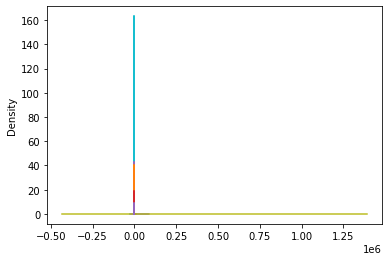

In [ ]:
colunas_tirar = ['f_QT_CONTR_SUS_PER*10000', 'f_QT_CONTR_REGIAO_SUS_PER*10000', 'f_Sem_Declaração_de_Cor_%_2010']
# tudo zerado

FUSÃO_COVID_TSE_IBGE_SUS_50_dummies = FUSÃO_COVID_TSE_IBGE_SUS_40_dummies.copy()
FUSÃO_COVID_TSE_IBGE_SUS_50_dummies.drop(colunas_tirar, axis = 1, inplace = True)

for item in FUSÃO_COVID_TSE_IBGE_SUS_50_dummies.columns:
  FUSÃO_COVID_TSE_IBGE_SUS_50_dummies[item].plot(kind = 'kde') # KDE (= kernel Density Estimate) ajuda-nos a visualizar a distribuição dos dados, análogo ao histograma.

In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_50_dummies = FUSÃO_COVID_TSE_IBGE_SUS_50_dummies.rename({'b_Tamnho_Mun_(0, 25000]': 'b_Tamnho_Mun_0_25k',
                                                    'b_Tamnho_Mun_(1000000, 20000000]': 'b_Tamnho_Mun_1000k_20M',
                                                    'b_Tamnho_Mun_(25000, 80000]': 'b_Tamnho_Mun_25k_80k', 
                                                    'b_Tamnho_Mun_(300000, 1000000]': 'b_Tamnho_Mun_300k_1M',
                                                    'b_Tamnho_Mun_(80000, 300000]': 'b_Tamnho_Mun_80k_300k'}, axis=1)


# **Normalizando RobustScaler**#

In [ ]:
FUSÃO_COVID_TSE_IBGE_SUS_50_dummies = FUSÃO_COVID_TSE_IBGE_SUS_50_dummies.reset_index().copy()

FUSÃO_COVID_TSE_IBGE_SUS_50_dummies.drop(['index'], axis = 1, inplace = True)


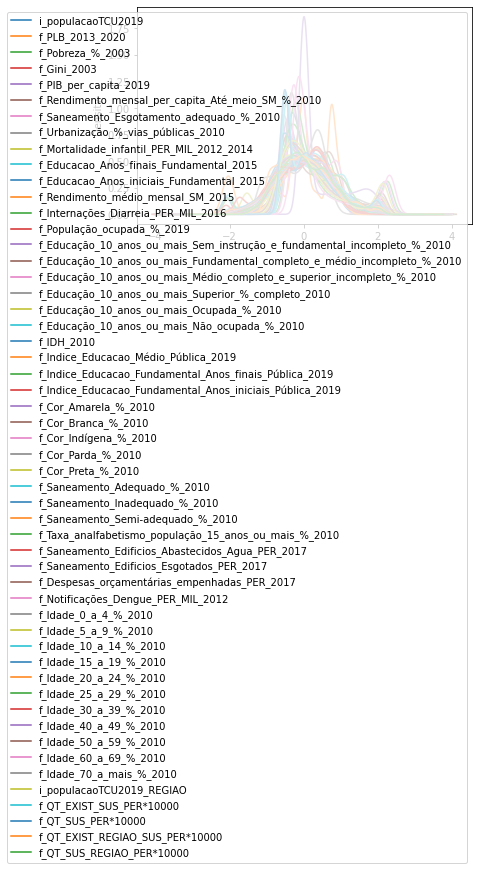

In [ ]:
from sklearn.preprocessing import RobustScaler

colunas_normalizando = ['i_populacaoTCU2019', 'f_PLB_2013_2020', 'f_Pobreza_%_2003',
       'f_Gini_2003', 'f_PIB_per_capita_2019',
       'f_Rendimento_mensal_per_capita_Até_meio_SM_%_2010',
       'f_Saneamento_Esgotamento_adequado_%_2010',
       'f_Urbanização_%_vias_públicas_2010',
       'f_Mortalidade_infantil_PER_MIL_2012_2014',
       'f_Educacao_Anos_finais_Fundamental_2015',
       'f_Educacao_Anos_iniciais_Fundamental_2015',
       'f_Rendimento_médio_mensal_SM_2015',
       'f_Internações_Diarreia_PER_MIL_2016', 'f_População_ocupada_%_2019',
       'f_Educação_10_anos_ou_mais_Sem_instrução_e_fundamental_incompleto_%_2010',
       'f_Educação_10_anos_ou_mais_Fundamental_completo_e_médio_incompleto_%_2010',
       'f_Educação_10_anos_ou_mais_Médio_completo_e_superior_incompleto_%_2010',
       'f_Educação_10_anos_ou_mais_Superior_%_completo_2010',
       'f_Educação_10_anos_ou_mais_Ocupada_%_2010',
       'f_Educação_10_anos_ou_mais_Não_ocupada_%_2010', 'f_IDH_2010',
       'f_Indice_Educacao_Médio_Pública_2019',
       'f_Indice_Educacao_Fundamental_Anos_finais_Pública_2019',
       'f_Indice_Educacao_Fundamental_Anos_iniciais_Pública_2019',
       'f_Cor_Amarela_%_2010', 'f_Cor_Branca_%_2010', 'f_Cor_Indígena_%_2010',
       'f_Cor_Parda_%_2010', 'f_Cor_Preta_%_2010',
       'f_Saneamento_Adequado_%_2010', 'f_Saneamento_Inadequado_%_2010',
       'f_Saneamento_Semi-adequado_%_2010',
       'f_Taxa_analfabetismo_população_15_anos_ou_mais_%_2010',
       'f_Saneamento_Edificios_Abastecidos_Agua_PER_2017',
       'f_Saneamento_Edificios_Esgotados_PER_2017',
       'f_Despesas_orçamentárias_empenhadas_PER_2017',
       'f_Notificações_Dengue_PER_MIL_2012', 'f_Idade_0_a_4_%_2010',
       'f_Idade_5_a_9_%_2010', 'f_Idade_10_a_14_%_2010',
       'f_Idade_15_a_19_%_2010', 'f_Idade_20_a_24_%_2010',
       'f_Idade_25_a_29_%_2010', 'f_Idade_30_a_39_%_2010',
       'f_Idade_40_a_49_%_2010', 'f_Idade_50_a_59_%_2010',
       'f_Idade_60_a_69_%_2010', 'f_Idade_70_a_mais_%_2010',
       'i_populacaoTCU2019_REGIAO', 'f_QT_EXIST_SUS_PER*10000',
       'f_QT_SUS_PER*10000', 'f_QT_EXIST_REGIAO_SUS_PER*10000',
       'f_QT_SUS_REGIAO_PER*10000']

colunas_novas = list(range(0, len(colunas_normalizando),1))

#df_churn_train_Robust
FUSÃO_COVID_TSE_IBGE_SUS_50_dummies_Robust = RobustScaler().fit_transform(FUSÃO_COVID_TSE_IBGE_SUS_50_dummies[colunas_normalizando])
FUSÃO_COVID_TSE_IBGE_SUS_50_dummies_Robust = pd.concat([FUSÃO_COVID_TSE_IBGE_SUS_50_dummies, pd.DataFrame(FUSÃO_COVID_TSE_IBGE_SUS_50_dummies_Robust)], axis = 1)

FUSÃO_COVID_TSE_IBGE_SUS_50_dummies_Robust [colunas_normalizando] = FUSÃO_COVID_TSE_IBGE_SUS_50_dummies_Robust [colunas_novas]
FUSÃO_COVID_TSE_IBGE_SUS_50_dummies_Robust.drop(colunas_novas, axis = 1, inplace = True)

# Gráfico
FUSÃO_COVID_TSE_IBGE_SUS_50_dummies_Robust[colunas_normalizando].plot(kind = 'kde')


In [ ]:
trataveis_3 = []

TESTAR = pd.DataFrame(FUSÃO_COVID_TSE_IBGE_SUS_50_dummies_Robust).copy()

for colunas in TESTAR:
  if TESTAR[colunas].isna().any() == True:
    trataveis_3.append(colunas)
    print ('colunas: ', colunas, ' ', TESTAR[colunas].isna().any(), ' ', TESTAR[colunas].isna().sum())
print ('\ntotal: \n', TESTAR.isna().sum().sum())


total: 
 0


In [ ]:
folder_path_o = '/content/drive/MyDrive/Pos/'
FUSÃO_COVID_TSE_IBGE_SUS_50_dummies_Robust.to_excel(folder_path_o + "FUSÃO_COVID_TSE_IBGE_SUS_50_dummies_Robust.xlsx", sheet_name='FUSÃO_Robust', index=False)
